In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
import pyrootutils

base_path = pyrootutils.setup_root(
    search_from=".",
    indicator=[".gitignore"],
    project_root_env_var=True,  # set the PROJECT_ROOT environment variable to root directory
    dotenv=True,  # load environment variables from .env if exists in root directory
    pythonpath=True,  # add root directory to the PYTHONPATH (helps with imports)
    cwd=True,  # change current working directory to the root directory (helps with filepaths)
)
import sys
import pandas as pd
import scanpy as sc
import squidpy as sq
import matplotlib.pyplot as plt
import seaborn as sns
import json
import wandb
import matplotlib
import matplotlib as mpl
from itertools import combinations
import os
import shutil
from sklearn.metrics import roc_auc_score

from src.utils.metrics import *
from src.data.utils import *
from src.utils.eval import *
from src.utils.wandb import *


sc.settings.verbosity = 0
sc.settings.set_figure_params(dpi=80, facecolor="white", frameon=False)

## Load data

In [139]:
st_path = "./data/spatial/lymph_node/st_lymph.h5ad"
sc_path = "./data/single-cell/lymph_node/sc_lymph.h5ad"

st_data = sc.read_h5ad(st_path) 
sc_data = sc.read_h5ad(sc_path)

annotations = pd.read_csv('./data/spatial/lymph_node/manual_GC_annot.csv')
assert (annotations["Barcode"] == st_data.obs.index).all()
y_true = np.array([[1, 0] if x == "GC" else [0, 1] for x in annotations["GC"].tolist()])
y_true_df = pd.DataFrame(y_true, columns=["Germinal Center", "non-GC"], index=annotations["Barcode"].tolist())

/root/miniconda3/envs/dissect_spatial/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


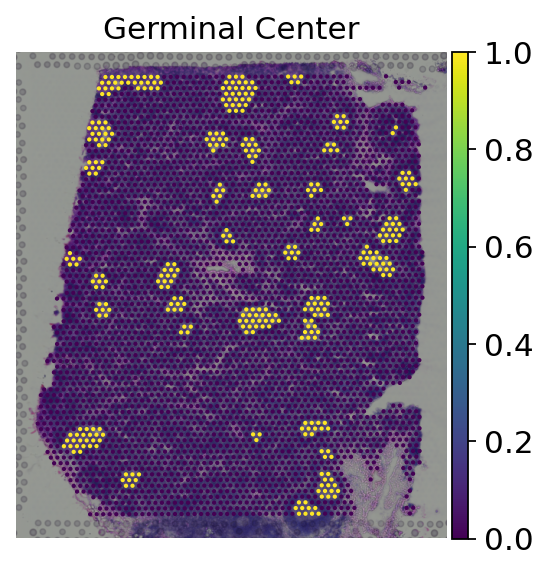

In [140]:
st_data.obs = pd.concat([st_data.obs, y_true_df], axis=1)
fig = sc.pl.spatial(
    st_data, color=list(y_true_df.columns)[0:1], show=False, save=False, vmin=0.0, vmax=1.0, wspace=0.0, ncols=6)
plt.savefig("./figures/lymph_node_gc.png", dpi=80, bbox_inches="tight")
plt.show()

## Load results

In [ ]:
run_name = "dandy-sound-299"
# run_name = "laced-cosmos-304"
lymph_result_new = get_result_for_run_name(run_name, project="dissect-spatial")

In [ ]:
path = "./experiments/experiment_lymph_node"
lymph_result_dissect = load_dissect_results(path)[1]
lymph_result_dissect

In [ ]:
# graph st result 
graph_st_result = sc.read_h5ad("/data/GraphST/Data/lymph_result.h5ad")
graph_st_result_df = graph_st_result.obs[graph_st_result.obs.columns.to_list()[4::]]

## Qualitative analysis

In [ ]:
st_data = sc.read_h5ad(st_path)
assert (lymph_result_new.index == st_data.obs.index).all()
st_data.obs = pd.concat([st_data.obs, lymph_result_new], axis=1)
fig = sc.pl.spatial(
    st_data, color=list(lymph_result_new.columns)[0::], show=False, save=False, vmin=0.0, vmax=1.0, wspace=0.0, ncols=6)
plt.savefig("./figures/lymph_node_new.png", dpi=80, bbox_inches="tight")
plt.show()

In [ ]:
st_data = sc.read_h5ad(st_path)
assert (lymph_result_dissect.index == st_data.obs.index).all()
st_data.obs = pd.concat([st_data.obs, lymph_result_dissect], axis=1)
fig = sc.pl.spatial(
    st_data, color=list(lymph_result_dissect.columns)[0::], show=False, save=False, vmin=0.0, vmax=1, wspace=0.0, ncols=6)
plt.savefig("./figures/lymph_node_dissect_ensemble.png", dpi=80, bbox_inches="tight")
plt.show()

/root/miniconda3/envs/dissect_spatial/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


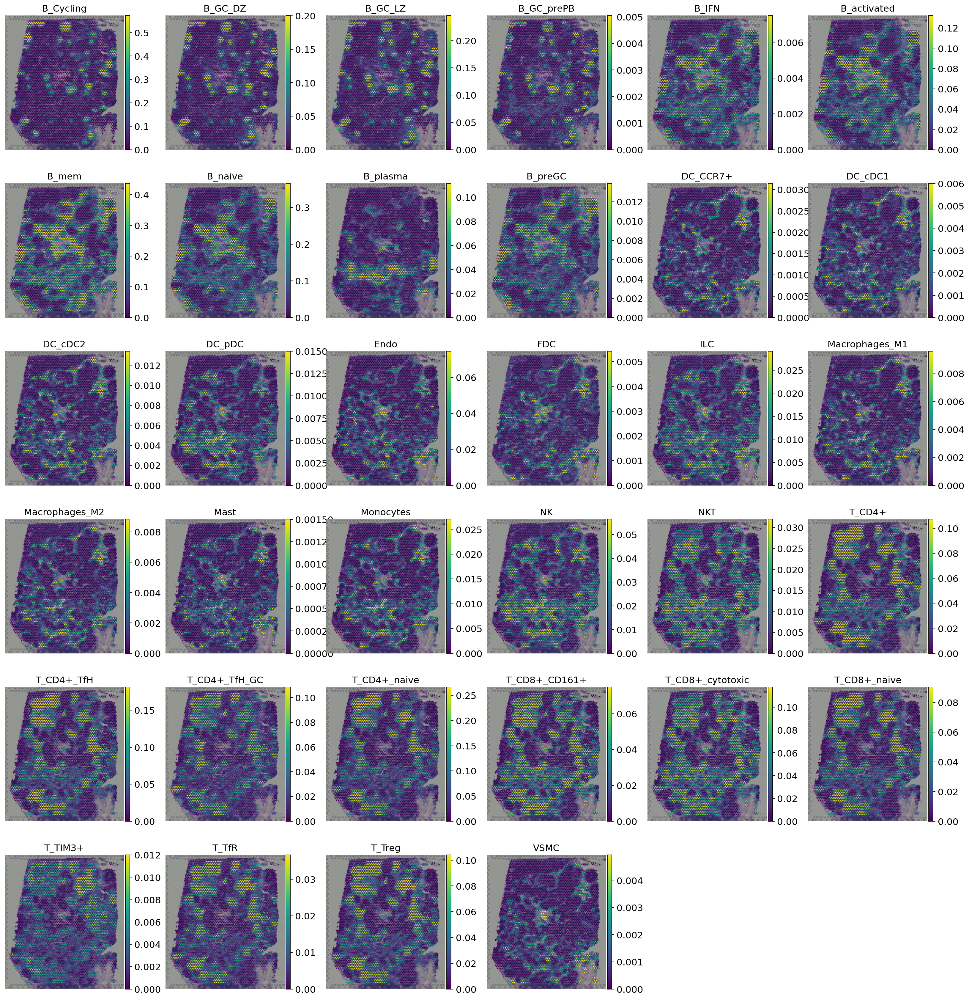

In [132]:
st_data = sc.read_h5ad(st_path)
assert (graph_st_result_df.index == st_data.obs.index).all()
st_data.obs = pd.concat([st_data.obs, graph_st_result_df], axis=1)
fig = sc.pl.spatial(
    st_data, color=list(graph_st_result_df.columns)[0::], show=False, save=False, vmin=0.0, vmax="p99", wspace=0.05, ncols=6)
plt.savefig("./figures/lymph_node_graphst.png", dpi=80, bbox_inches="tight")
plt.show()

## Quantitative analysis


### Fake predictions

In [ ]:
y_true.sum()

In [ ]:
# calculate auc score for only predicting one class
y_pred_fake = np.zeros(y_true.shape)
y_pred_fake[:, 1] = 0.98
y_pred_fake[:, 0] = 0.02
gc_mask = y_true[:, 0] == 1
non_gc_mask = y_true[:, 1] == 1
y_pred_fake[gc_mask, 0] = 0.020001
y_pred_fake[gc_mask, 1] = 0.979999
# print(y_pred_fake[gc_mask, :])
auc_score = roc_auc_score(y_true, y_pred_fake)
rmse = np.sqrt(np.mean((y_true - y_pred_fake)**2))
print(f"auc: {auc_score}")
print(f"rmse: {rmse}")

In [ ]:
gc_mask.sum()
# non_gc_mask.sum()

### Methods performances

In [128]:
def plot_performance_hist(result, y_true, gc_cols, method_name=None, save_path=None):
    gc_mask = y_true[:, 0] == 1
    non_gc_mask = y_true[:, 1] == 1

    fig, axs = plt.subplots(4, 2, figsize=(5, 6.3), sharey=False)
    axs = axs.ravel()
    if method_name is not None:
        fig.suptitle(f"{method_name}")
    fig.tight_layout()

    for k, gc_col_ in enumerate(gc_cols):
        no_gc_cols = [col for col in result.columns if not col == gc_col_]
        y_pred_df = pd.concat([result[gc_col_], result[no_gc_cols].sum(axis=1)], axis=1)
        y_pred = y_pred_df.to_numpy()

        sns.histplot(y_pred[gc_mask, 0], ax=axs[2*k], color="blue", label="GC spots")
        sns.histplot(y_pred[non_gc_mask, 0], ax=axs[2*k + 1], color="red", label="non-GC spots")
        for ax in axs[2*k: 2*k + 2]:
            ax.set_xlabel(f"{gc_col_} prob.")
            # ax.set_ylabel("Count")
            ax.legend()
        axs[2*k + 1].set_ylabel("")
        axs[2*k + 1].set_xlim(0, 0.1)
        axs[2*k].set_xlim(0, 1.0)
    if save_path is not None:
        plt.savefig(save_path, dpi=100, bbox_inches="tight")
    plt.show()

In [129]:
gc_cols = ["B_GC_DZ", "B_GC_LZ", "B_GC_prePB", "B_Cycling"]
for gc_col in gc_cols:
    no_gc_cols = [col for col in lymph_result_new.columns if not col == gc_col]
    y_pred_df = pd.concat([lymph_result_new[gc_col], lymph_result_new[no_gc_cols].sum(axis=1)], axis=1)
    y_pred = y_pred_df.to_numpy()
    auc_score = roc_auc_score(y_true, y_pred, average="weighted")
    rmse = np.sqrt(np.mean((y_true - y_pred)**2))
    print(f"auc: {auc_score}")
    print(f"rmse: {rmse}")

auc: 0.886038594042087
rmse: 0.27307843748067245
auc: 0.7769219862465693
rmse: 0.2842544901811845
auc: 0.5126082083065329
rmse: 0.29553986525849824
auc: 0.9357542132579668
rmse: 0.22388156810147028


In [ ]:
plot_performance_hist(
    lymph_result_new,
    y_true,
    gc_cols,
    method_name="MultiChannelGNN",
    save_path="./figures/lymph_node_gc_prob_hist_latest.png",
)


In [ ]:
for gc_col in gc_cols:
    no_gc_cols = [col for col in lymph_result_dissect.columns if not col == gc_col]
    y_pred_df = pd.concat([lymph_result_dissect[gc_col], lymph_result_dissect[no_gc_cols].sum(axis=1)], axis=1)
    y_pred = y_pred_df.to_numpy()
    auc_score = roc_auc_score(y_true, y_pred, average="weighted")
    rmse = np.sqrt(np.mean((y_true - y_pred)**2))
    print(f"auc: {auc_score}")
    print(f"rmse: {rmse}")

In [ ]:
plot_performance_hist(
    lymph_result_dissect,
    y_true,
    gc_cols,
    method_name="Dissect ensemble",
    save_path="./figures/lymph_node_gc_prob_hist_dissect.png",
)

#### GraphST

In [ ]:
graph_st_result.obs[graph_st_result.obs.columns.to_list()[4::]]

In [ ]:
gc_cols = ["B_GC_DZ", "B_GC_LZ", "B_GC_prePB", "B_Cycling"]
for gc_col in gc_cols:
    no_gc_cols = [col for col in graph_st_result_df.columns if not col == gc_col]
    y_pred_df = pd.concat([graph_st_result_df[gc_col], graph_st_result_df[no_gc_cols].sum(axis=1)], axis=1)
    y_pred = y_pred_df.to_numpy()
    auc_score = roc_auc_score(y_true, y_pred)
    rmse = np.sqrt(np.mean((y_true - y_pred)**2))
    print(f"auc: {auc_score}")
    print(f"rmse: {rmse}")

In [ ]:
plot_performance_hist(
    graph_st_result_df,
    y_true,
    gc_cols,
    method_name="GraphST",
    save_path="./figures/lymph_node_gc_prob_hist_graphst.png",
)

### Performance summary

In [134]:
method_results = [graph_st_result_df, lymph_result_new, lymph_result_dissect]
method_names = ["GraphST", "MultiChannelGNN", "Dissect"]
result_metrics = []
for name, result in zip(method_names, method_results):    
    for gc_col_ in gc_cols:
        no_gc_cols = [col for col in result.columns if not col == gc_col_]
        y_pred_df = pd.concat(
            [result[gc_col_], result[no_gc_cols].sum(axis=1)],
            axis=1,
        )
        y_pred = y_pred_df.to_numpy()
        auc_score = roc_auc_score(y_true, y_pred)
        rmse = np.sqrt(np.mean((y_true - y_pred) ** 2))
        accuracy = np.mean(np.argmax(y_pred, axis=1) == np.argmax(y_true, axis=1))
        # print(f"auc: {auc_score}")
        # print(f"rmse: {rmse}")
        result_metrics.append(
            pd.DataFrame({"Method": name, "GC class": gc_col_, "AUC": auc_score, "RMSE": rmse, "Accuracy": accuracy}, index=[0])
        )
result_metrics = pd.concat(result_metrics, axis=0, ignore_index=True)
result_metrics.set_index(["Method", "GC class"])

AUC      RMSE  Accuracy
Method          GC class                                
GraphST         B_GC_DZ     0.988538  0.257216  0.906320
                B_GC_LZ     0.987668  0.248962  0.906320
                B_GC_prePB  0.977346  0.304856  0.906320
                B_Cycling   0.979883  0.205256  0.936307
MultiChannelGNN B_GC_DZ     0.886038  0.273078  0.907063
                B_GC_LZ     0.776922  0.284254  0.906568
                B_GC_prePB  0.512608  0.295540  0.906320
                B_Cycling   0.935755  0.223882  0.935068
Dissect         B_GC_DZ     0.978467  0.280973  0.906320
                B_GC_LZ     0.960261  0.286872  0.906320
                B_GC_prePB  0.928528  0.296017  0.906320
                B_Cycling   0.975977  0.240684  0.922181